# Wang 2022 - Clustering
<div class="alert alert-warning">

**What this notebook does**
    
In this notebooke the previously normalized samples will be merged and batch corrected to visualize the full dataset of Wang et. al. Additionally, existing annotation and sample specific prefixes were added. This is the last step within the atlas processing.

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering')

In [4]:
!ls data

agarwal_base_merge_base.h5ad  smajic_base_merge_base.h5ad
agarwal_merge_base_BC.h5ad    smajic_doublets_merge_base.h5ad
altena_base_merge_base.h5ad   smajic_merge_base_BC.h5ad
altena_merge_base_BC.h5ad     welch_base_merge_base.h5ad
siletti_base_merge_base.h5ad  welch_merge_base_BC.h5ad
siletti_merge_base_BC.h5ad


In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/4_clustering'

In [6]:
path='/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization/data/processed_'
suffix='base_S'
atlas='wang'

S06=f'{path}{atlas}_{suffix}06.h5ad'
S07=f'{path}{atlas}_{suffix}07.h5ad'
S09=f'{path}{atlas}_{suffix}09.h5ad'
S11=f'{path}{atlas}_{suffix}11.h5ad'
S16=f'{path}{atlas}_{suffix}16.h5ad'
S22=f'{path}{atlas}_{suffix}22.h5ad'
S23=f'{path}{atlas}_{suffix}23.h5ad'
S24=f'{path}{atlas}_{suffix}24.h5ad'
S33=f'{path}{atlas}_{suffix}33.h5ad'
S36=f'{path}{atlas}_{suffix}36.h5ad'

In [29]:
files = [S06,S07,S09,S11,S16,S22,S23,S24,S33,S36]

In [33]:
names = ['S06','S07','S09','S11','S16','S22','S23','S24','S33','S36']

In [34]:
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i]+"_"+"preprocessed")
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_S06_preprocessed  is loaded
adata_S07_preprocessed  is loaded
adata_S09_preprocessed  is loaded
adata_S11_preprocessed  is loaded
adata_S16_preprocessed  is loaded
adata_S22_preprocessed  is loaded
adata_S23_preprocessed  is loaded
adata_S24_preprocessed  is loaded
adata_S33_preprocessed  is loaded
adata_S36_preprocessed  is loaded


In [35]:
adata_S33_preprocessed.obs['sample']

CTGAGGCTCGTCAAAC-1    SAMN21889433
AACGAAACAGGCTCTG-1    SAMN21889433
TTAGGCACAAGTGGCA-1    SAMN21889433
ATGAGTCAGGATACGC-1    SAMN21889433
CGGGCATTCGATGCTA-1    SAMN21889433
                          ...     
CTCCACACAAAGTGTA-1    SAMN21889433
GTCTGTCAGAAGTATC-1    SAMN21889433
CACAACACAGTTGCGC-1    SAMN21889433
CAATTTCTCTCGACGG-1    SAMN21889433
CTGTACCGTGACTCGC-1    SAMN21889433
Name: sample, Length: 6149, dtype: category
Categories (1, object): ['SAMN21889433']

## Merge
Observation suffixes are sample specific, so to match the older atlas annotation we match there suffixes.

In [38]:
adata_wang_merge=ad.concat([adata_S06_preprocessed,adata_S07_preprocessed,adata_S09_preprocessed,adata_S11_preprocessed,adata_S16_preprocessed,adata_S22_preprocessed,adata_S23_preprocessed,adata_S24_preprocessed,adata_S33_preprocessed,adata_S36_preprocessed],  join="outer", fill_value=0)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [39]:
adata_wang_merge.obs['sample']

TAATCTCCAAGTTGGG-1    SAMN21889406
CCCTCTCAGTGCCCGT-1    SAMN21889406
AACACACCATAGGCGA-1    SAMN21889406
AATGACCTCTTGGTGA-1    SAMN21889406
GCCGTGATCTTCTTCC-1    SAMN21889406
                          ...     
TGGGAGATCACGGTCG-1    SAMN21889436
TGTTGGACATCTTCGC-1    SAMN21889436
TTACGTTGTCAACCTA-1    SAMN21889436
TGTACAGAGGTGCGAT-1    SAMN21889436
TTGCGTCGTCAAGCCC-1    SAMN21889436
Name: sample, Length: 43477, dtype: category
Categories (10, object): ['SAMN21889406', 'SAMN21889407', 'SAMN21889409', 'SAMN21889411', ..., 'SAMN21889423', 'SAMN21889424', 'SAMN21889433', 'SAMN21889436']

In [12]:
'''original_cellclass_lvl1 =list()
original_subclass_lvl3_1 =list()
original_cellclass_lvl1_n =list()
original_lineage =list()
original_subclass_lvl2 =list()
original_celltype_lvl3 =list()

annotation=[original_cellclass_lvl1,original_subclass_lvl3_1,original_cellclass_lvl1_n,original_lineage,original_subclass_lvl2,original_celltype_lvl3]
annotation_names=['original_cellclass_lvl1','original_subclass_lvl3_1','original_cellclass_lvl1_n','original_lineage','original_subclass_lvl2','original_celltype_lvl3']
annotation_names_og=['cellclass_lvl1','subclass_lvl3_1','cellclass_lvl1_n','lineage','subclass_lvl2','celltype_lvl3']


for i in range(len(annotation)):
    except_counter=0
    for obs_name in adata_altena_merge.obs_names:
        try:
            annotation[i].append(old.obs[annotation_names_og[i]][obs_name])
        except:
            except_counter+=1
            annotation[i].append('None')
    print(except_counter)
    
'''

"original_cellclass_lvl1 =list()\noriginal_subclass_lvl3_1 =list()\noriginal_cellclass_lvl1_n =list()\noriginal_lineage =list()\noriginal_subclass_lvl2 =list()\noriginal_celltype_lvl3 =list()\n\nannotation=[original_cellclass_lvl1,original_subclass_lvl3_1,original_cellclass_lvl1_n,original_lineage,original_subclass_lvl2,original_celltype_lvl3]\nannotation_names=['original_cellclass_lvl1','original_subclass_lvl3_1','original_cellclass_lvl1_n','original_lineage','original_subclass_lvl2','original_celltype_lvl3']\nannotation_names_og=['cellclass_lvl1','subclass_lvl3_1','cellclass_lvl1_n','lineage','subclass_lvl2','celltype_lvl3']\n\n\nfor i in range(len(annotation)):\n    except_counter=0\n    for obs_name in adata_altena_merge.obs_names:\n        try:\n            annotation[i].append(old.obs[annotation_names_og[i]][obs_name])\n        except:\n            except_counter+=1\n            annotation[i].append('None')\n    print(except_counter)\n    \n"

In [40]:
adata_wang_merge.write(os.path.join('./data/wang_base_merge_base.h5ad'))


## All data

pca again

In [41]:
object_names_merged = ['adata_merge']
names = ['wang_merge']
path='/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/data'
files=[f'{path}/wang_base_merge_base.h5ad']

numberobj=1
for i in range(numberobj):
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_merge  is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [42]:
#To make reproducible plots
np.random.seed(41)

In [43]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

wang_merge


In [44]:
nn= 15 #default 15
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_merged[i]])

wang_merge


wang_merge


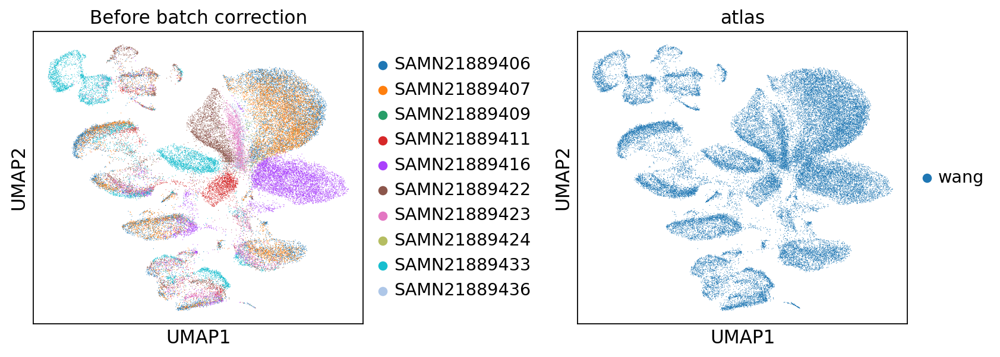

In [45]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged[i]],color=['sample', 'atlas'], wspace=0.5,s=1, title='Before batch correction')

wang_merge


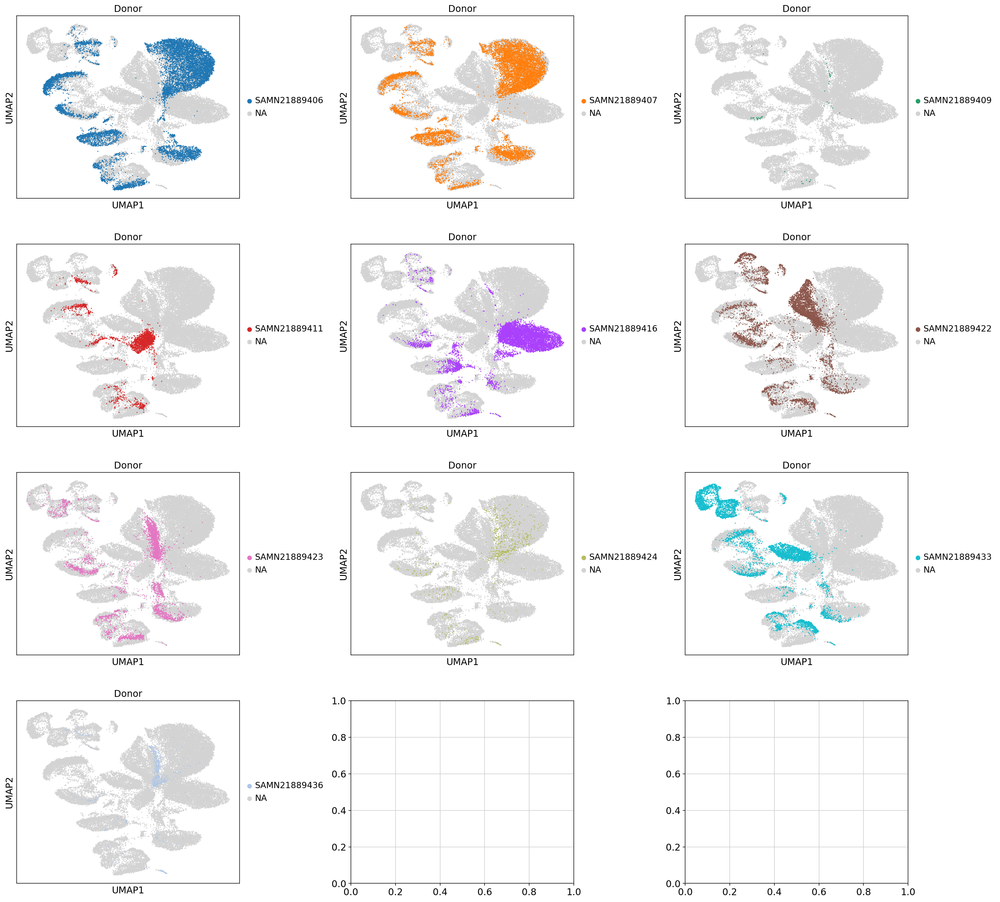

In [46]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(4, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889406', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889407', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889409', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889411', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889416', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889422', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889423', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889424', use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889433', use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'SAMN21889436', use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

wang_merge


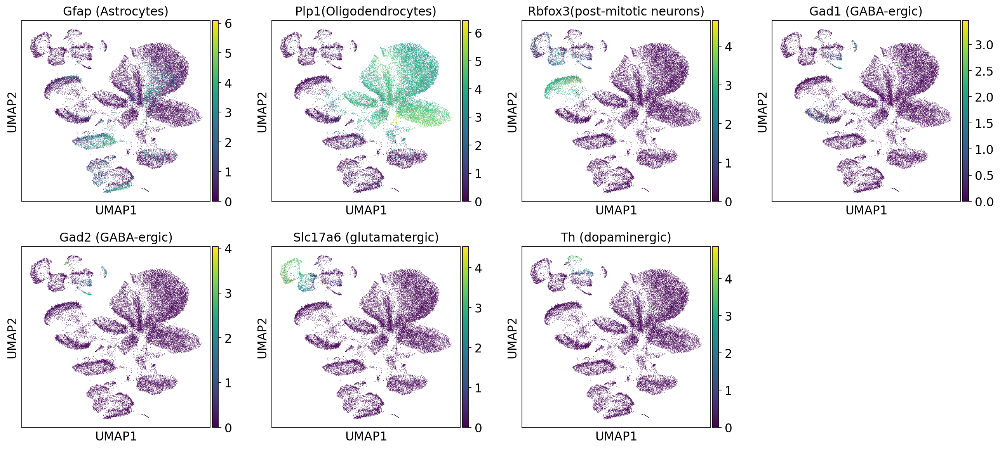

In [47]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_merged[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_merged[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','TH'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=1, save=f'/{names[i]}_subplots_markers.png')
    else:
        sc.pl.umap(locals()[object_names_merged[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [48]:
object_names_merged_BC=list()

for i in range(numberobj):
    object_names_merged_BC.append("adata"+"_"+names[i]+"_"+"full_BC")
    locals()[object_names_merged_BC[i]] = locals()[object_names_merged[i]].copy()
    print(object_names_merged_BC[i],' is loaded')

adata_wang_merge_full_BC  is loaded


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [49]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged_BC[i]], svd_solver='arpack')

wang_merge


In [50]:
for i in range(numberobj):
    print(names[i])
    sc.external.pp.harmony_integrate(locals()[object_names_merged_BC[i]], key =['sample'])

wang_merge


2023-09-25 14:49:16,826 - harmonypy - INFO - Iteration 1 of 10
2023-09-25 14:50:04,157 - harmonypy - INFO - Iteration 2 of 10
2023-09-25 14:50:51,342 - harmonypy - INFO - Iteration 3 of 10
2023-09-25 14:51:36,642 - harmonypy - INFO - Iteration 4 of 10
2023-09-25 14:52:22,831 - harmonypy - INFO - Iteration 5 of 10
2023-09-25 14:53:07,741 - harmonypy - INFO - Iteration 6 of 10
2023-09-25 14:53:54,684 - harmonypy - INFO - Iteration 7 of 10
2023-09-25 14:54:31,482 - harmonypy - INFO - Converged after 7 iterations


wang_merge


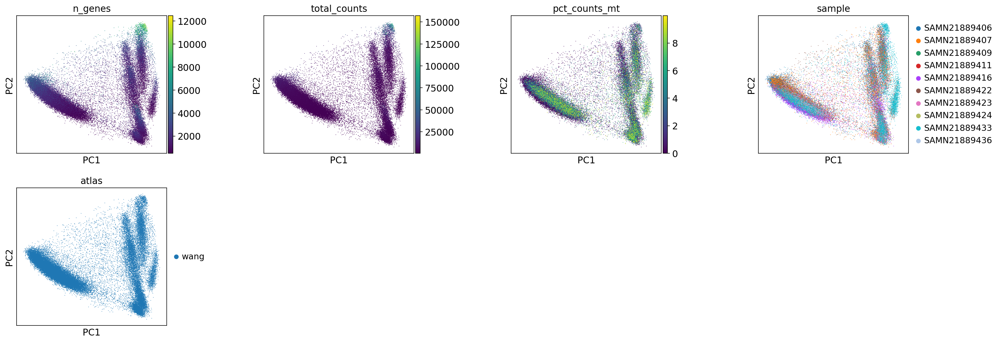

In [51]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]], color=['n_genes', 'total_counts', 'pct_counts_mt', 'sample', 'atlas'],wspace=0.5)


wang_merge


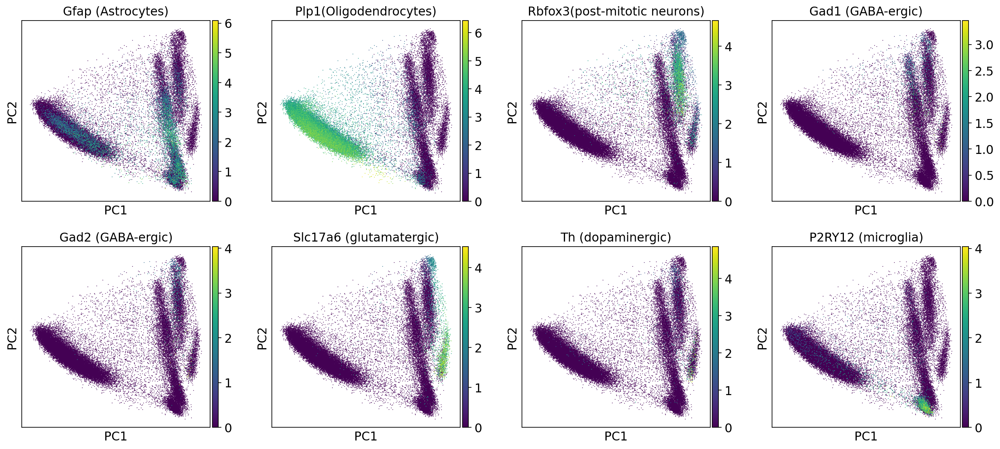

In [52]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]],use_raw=False, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [53]:
nn=40
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged_BC[i]], n_neighbors=nn, n_pcs=50,use_rep='X_pca_harmony')
    sc.tl.umap(locals()[object_names_merged_BC[i]])
    

wang_merge


wang_merge


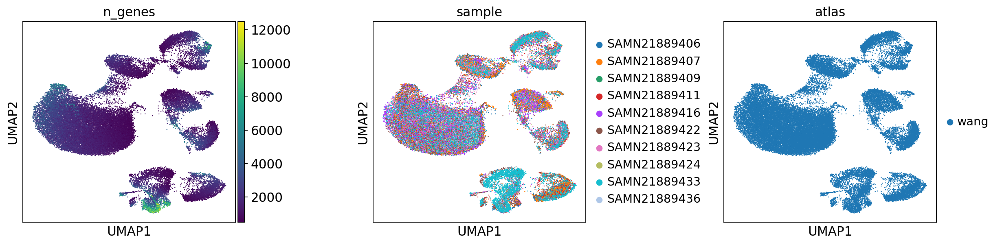

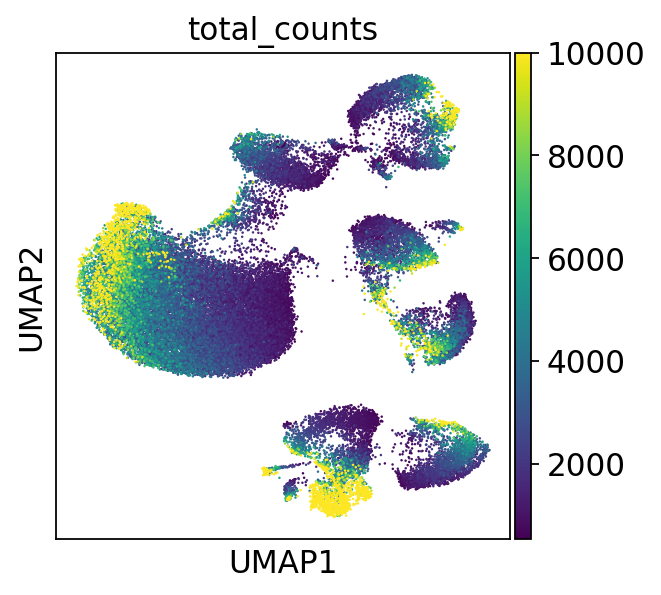

In [54]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

wang_merge


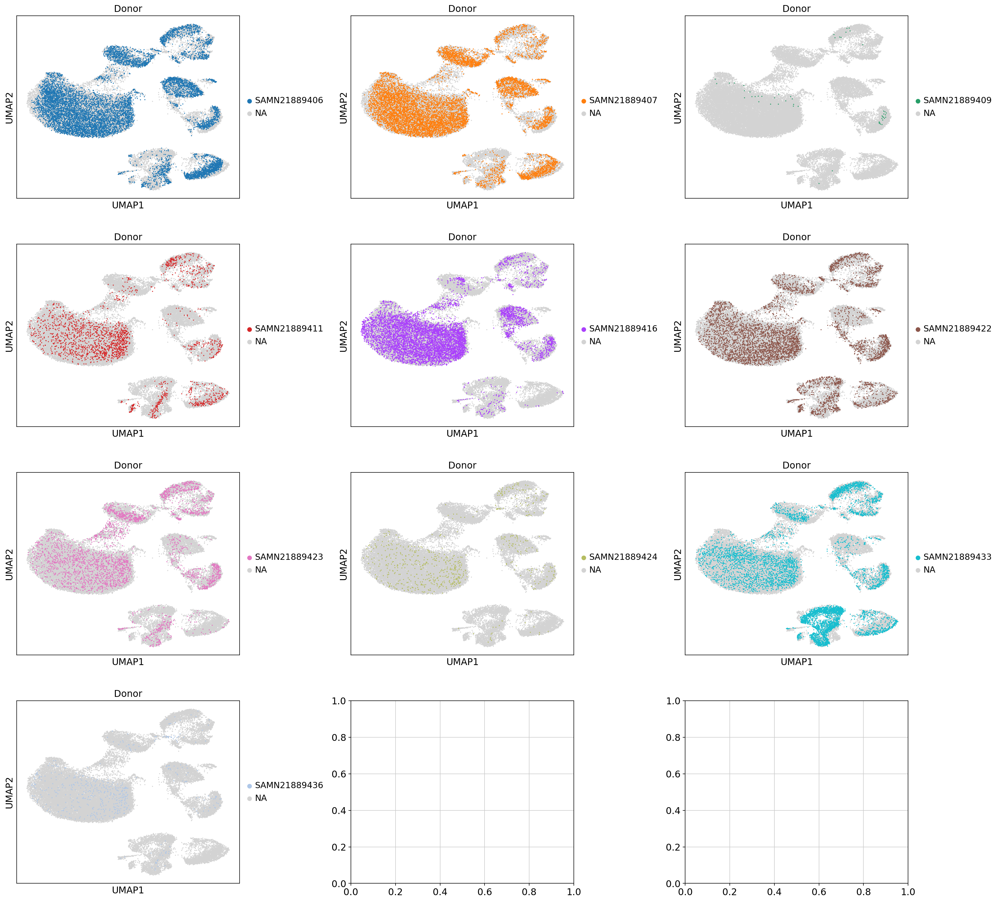

In [55]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(4, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889406', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889407', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889409', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889411', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889416', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889422', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889423', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889424', use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889433', use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'SAMN21889436', use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_BC_subplots.png',bbox_inches='tight')

wang_merge


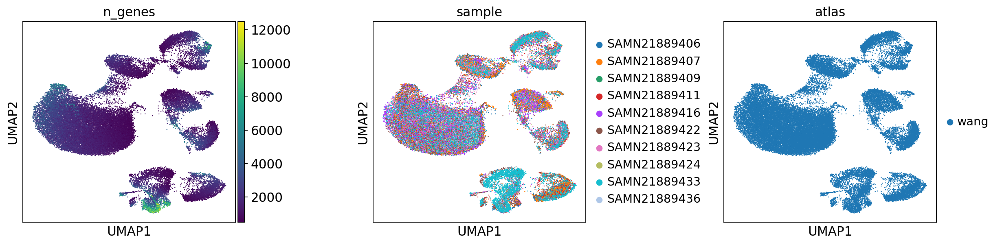

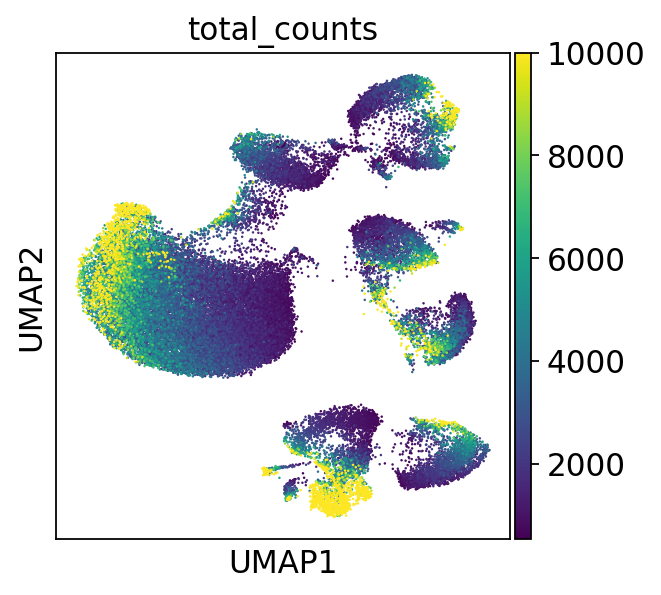

In [56]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

wang_merge


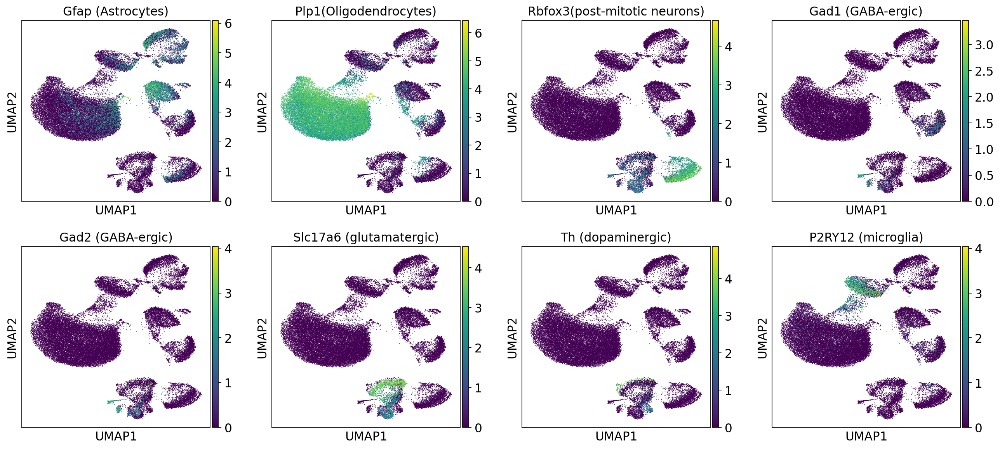

In [57]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],use_raw=False,title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [58]:
adata_wang_merge_full_BC.write(os.path.join('./data/wang_merge_base_BC.h5ad'))


In [59]:
locals()[object_names_merged_BC[i]]

AnnData object with n_obs × n_vars = 43477 × 33232
    obs: 'species', 'gender', 'age', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    uns: 'pca', 'neighbors', 'umap', 'sample_colors', 'atlas_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'